In [1]:
import os
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from graphufs.spatialmap import SpatialMap 
import cartopy.crs as ccrs
import colormaps as cm
import pandas as pd

In [2]:
def plot_rmse(ax, rmse, unit=None, timestep="6hr", varname=None):
    
    ax.plot(rmse, linewidth=2)
    ylabel = f"RMSE [{unit}]" if unit is not None else "RMSE"
    xlabel = f"Lead time (in days)"
    
    ax.set_ylabel(ylabel, fontsize=12, fontweight="bold")
    ax.set_xlabel(xlabel, fontsize=12, fontweight="bold")

    lead_time = 40
    ax.set_xticks(np.arange(3, lead_time, 4))
    ax.set_xticklabels(np.arange(1, int(lead_time/4+1)))
    
    ax.tick_params(axis="x", labelsize=12,)
    ax.tick_params(axis="y", labelsize=12,)

    ax.grid(True, which='both', linestyle=':', linewidth=0.5)
    
    if varname is not None:
        ax.set_title(f"{varname}", fontsize=12, fontweight="bold")
    
    plt.tight_layout()
    
    return ax

In [3]:
# output metadata
_scratch = "/pscratch/sd/n/nagarwal/"
_prototype = "ocn-only"
_expt = "R4"
_prototype_home = "/global/homes/n/nagarwal/graph-ufs/prototypes/"
_inference_dir = os.path.join(_scratch, _prototype, _expt,
                              "inference_T3M", "validation")
_figdir = os.path.join(os.getcwd(), "figures")

In [4]:
# GraphUFS predictions
fname = "graphufs.240h.zarr"
ds_pred = xr.open_zarr(os.path.join(_inference_dir, fname))
ds_pred

<xarray.Dataset> Size: 175GB
Dimensions:    (time: 513, lead_time: 40, lat: 192, lon: 384, z_l: 7)
Coordinates:
  * lat        (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * lead_time  (lead_time) timedelta64[ns] 320B 0 days 06:00:00 ... 10 days 0...
  * lon        (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * time       (time) datetime64[ns] 4kB 2022-01-01 ... 2023-10-03
  * z_l        (z_l) float64 56B 0.5154 11.06 47.21 93.67 152.1 271.2 417.7
Data variables:
    SSH        (time, lead_time, lat, lon) float32 6GB dask.array<chunksize=(1, 40, 192, 384), meta=np.ndarray>
    so         (time, lead_time, z_l, lat, lon) float32 42GB dask.array<chunksize=(1, 40, 7, 192, 384), meta=np.ndarray>
    temp       (time, lead_time, z_l, lat, lon) float32 42GB dask.array<chunksize=(1, 40, 7, 192, 384), meta=np.ndarray>
    uo         (time, lead_time, z_l, lat, lon) float32 42GB dask.array<chunksize=(1, 40, 7, 192, 384), meta=np.ndarray>
    vo         (time, lead_time, z_l, lat, lon) float32 42GB dask.array<chunksize=(1, 40, 7, 192, 384), meta=np.ndarray>

In [5]:
# Replay targets
fname = "replay.240h.zarr"
ds_tar = xr.open_zarr(os.path.join(_inference_dir, fname))
ds_tar

<xarray.Dataset> Size: 345GB
Dimensions:    (time: 513, lead_time: 40, lat: 192, lon: 384, z_l: 7)
Coordinates:
  * lat        (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * lead_time  (lead_time) timedelta64[ns] 320B 0 days 06:00:00 ... 10 days 0...
  * lon        (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * time       (time) datetime64[ns] 4kB 2022-01-01 ... 2023-10-03
  * z_l        (z_l) float64 56B 0.5154 11.06 47.21 93.67 152.1 271.2 417.7
Data variables:
    SSH        (time, lead_time, lat, lon) float32 6GB dask.array<chunksize=(1, 40, 192, 384), meta=np.ndarray>
    so         (time, z_l, lead_time, lat, lon) float64 85GB dask.array<chunksize=(1, 7, 40, 192, 384), meta=np.ndarray>
    temp       (time, z_l, lead_time, lat, lon) float64 85GB dask.array<chunksize=(1, 7, 40, 192, 384), meta=np.ndarray>
    uo         (time, z_l, lead_time, lat, lon) float64 85GB dask.array<chunksize=(1, 7, 40, 192, 384), meta=np.ndarray>
    vo         (time, z_l, lead_time, lat, lon) float64 85GB dask.array<chunksize=(1, 7, 40, 192, 384), meta=np.ndarray>

In [6]:
# Open the existing ocean zarr-store
ocn = xr.open_zarr(
    "gs://noaa-ufs-gefsv13replay/ufs-hr1/0.25-degree-subsampled/06h-freq/zarr/mom6.zarr",
    storage_options={"token": "anon"},
)
ocn

<xarray.Dataset> Size: 5TB
Dimensions:       (time: 43826, lat: 192, lon: 384, zl: 75, z_l: 75)
Coordinates:
    cftime        (time) object 351kB dask.array<chunksize=(21913,), meta=np.ndarray>
    ftime         (time) timedelta64[ns] 351kB dask.array<chunksize=(21913,), meta=np.ndarray>
  * lat           (lat) float64 2kB 89.82 88.89 87.95 ... -87.25 -88.18 -89.12
  * lon           (lon) float64 3kB 0.0 0.9375 1.875 2.812 ... 357.2 358.1 359.1
  * time          (time) datetime64[ns] 351kB 1993-12-31T18:00:00 ... 2023-12-31
  * z_l           (z_l) float64 600B 0.5154 1.571 2.687 ... 5.698e+03 5.902e+03
  * zl            (zl) float64 600B 1.0 3.0 5.0 ... 3.591e+03 5.111e+03
Data variables: (12/20)
    Heat_PmE      (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    LW            (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    LwLatSens     (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SSH           (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    SW            (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    evap          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    ...            ...
    so            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    taux          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    tauy          (time, lat, lon) float32 13GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    temp          (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    uo            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
    vo            (time, z_l, lat, lon) float32 969GB dask.array<chunksize=(1, 75, 192, 384), meta=np.ndarray>
Attributes:
    abstract:         The NOAA Unified Forecast System (UFS) / Global Ensembl...
    acknowledgement:  To provide appropriate attribution under this license, ...
    description:      This zarr store is a subset of the original GEFSv13 UFS...
    license:          The Global Ensemble Forecast System version 13 (GEFSv13...

In [7]:
# Open the existing atm zarr-store
atm = xr.open_zarr(
    "gs://noaa-ufs-gefsv13replay/ufs-hr1/0.25-degree-subsampled/03h-freq/zarr/fv3.zarr",
    storage_options={"token": "anon"},
)
atm

<xarray.Dataset> Size: 60TB
Dimensions:        (time: 87020, grid_yt: 192, grid_xt: 384, pfull: 127)
Coordinates:
    cftime         (time) object 696kB dask.array<chunksize=(21755,), meta=np.ndarray>
    ftime          (time) timedelta64[ns] 696kB dask.array<chunksize=(21755,), meta=np.ndarray>
  * grid_xt        (grid_xt) float64 3kB 0.0 0.9375 1.875 ... 357.2 358.1 359.1
  * grid_yt        (grid_yt) float64 2kB 89.82 88.89 87.95 ... -88.18 -89.12
  * pfull          (pfull) float32 508B 0.01278 0.02033 0.03177 ... 996.2 998.8
  * time           (time) datetime64[ns] 696kB 1993-12-31T18:00:00 ... 2023-1...
Data variables: (12/183)
    acond          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    albdo_ave      (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alnsf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alnwf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alvsf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    alvwf          (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    ...             ...
    xtts           (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xu             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xv             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xz             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    xzts           (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
    zc             (time, grid_yt, grid_xt) float32 26GB dask.array<chunksize=(1, 192, 384), meta=np.ndarray>
Attributes:
    abstract:         The NOAA Unified Forecast System (UFS) / Global Ensembl...
    acknowledgement:  To provide appropriate attribution under this license, ...
    description:      This zarr store is a subset of the original GEFSv13 UFS...
    license:          The Global Ensemble Forecast System version 13 (GEFSv13...

## Surface Pressure

In [9]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "pressfc"

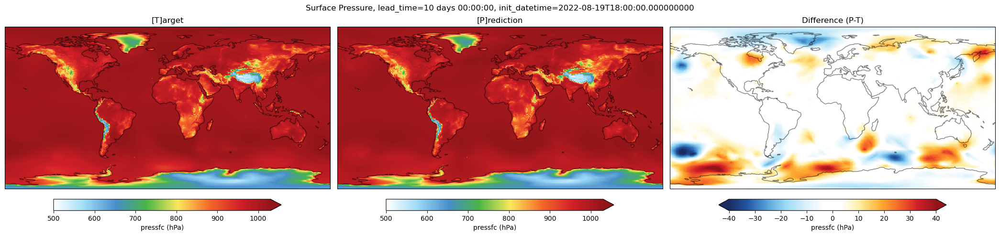

In [10]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"pressfc (hPa)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":500, "vmax":1030,}

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,)/100    # to hPa
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,)/100   # to hPa
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-40
kwargs["vmax"]=40
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"Surface Pressure, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

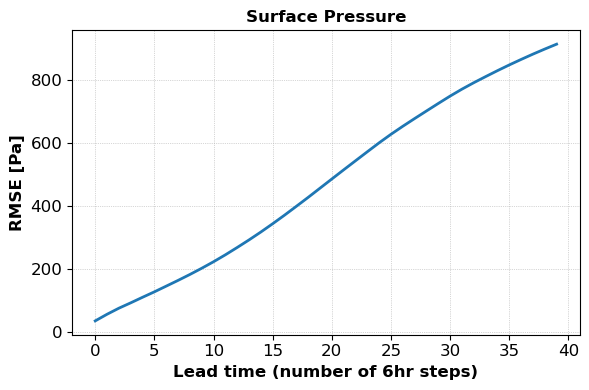

In [10]:
# RMSE Error
pressfc_sqerror = (ds_tar.pressfc - ds_pred.pressfc)**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(pressfc_sqerror.mean(dim=('time','lat', 'lon'))), 
             unit="Pa", timestep="6hr", varname="Surface Pressure")

plt.show()

## MSLP

In [32]:
def pressfc2mslp(pressfc, t2m, q2m, hgtsfc_static):
    """
    Inputs:
    pressfc: surface pressure
    t2m    : 2m temperature
    q2m    : 2m specific humidity
    hgtsfc_static : surface geopotential height (orography)
    
    Output:
    mslp: mean sea level pressure
    """
    # Constants
    g = 9.80665   # m/s²
    Rd = 287.05   # gas constant for dry air, J/(kg·K)

    Tv = t2m*(1+0.61*q2m)
    mslp = pressfc * np.exp((g * hgtsfc_static) / (Rd * Tv))

    return mslp

In [33]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = 19
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "mslp"

In [34]:
mslp_pred = pressfc2mslp(ds_pred.pressfc, ds_pred.tmp2m, ds_pred.spfh2m, atm.hgtsfc_static.rename({"grid_xt":"lon", "grid_yt":"lat"}))
mslp_tar = pressfc2mslp(ds_tar.pressfc, ds_tar.tmp2m, ds_tar.spfh2m, atm.hgtsfc_static.rename({"grid_xt":"lon", "grid_yt":"lat"}))

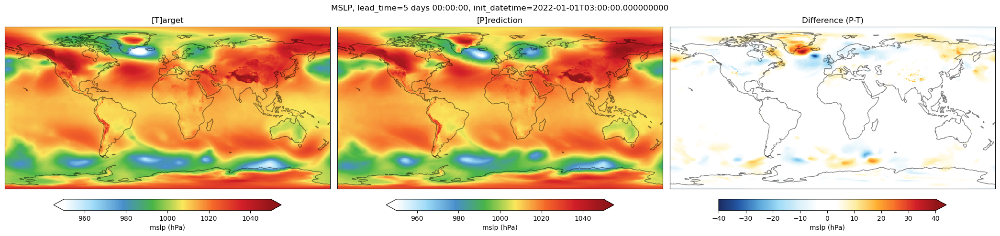

In [35]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"mslp (hPa)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":950, "vmax":1050,}

# target
target = mslp_tar.isel(time=itime, lead_time=ileadtime)/100    # to hPa
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = mslp_pred.isel(time=itime, lead_time=ileadtime)/100   # to hPa
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-40
kwargs["vmax"]=40
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"MSLP, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

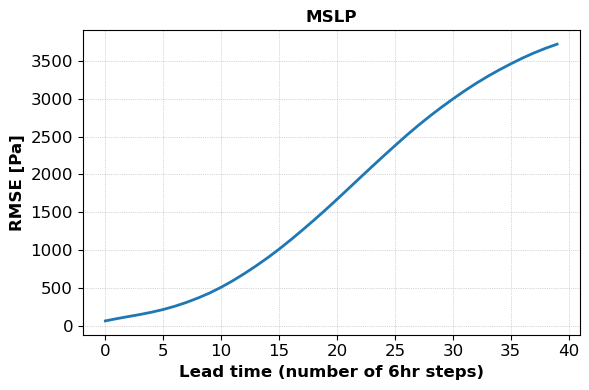

In [15]:
# RMSE Error
mslp_sqerror = (mslp_tar - mslp_pred)**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(mslp_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="Pa", timestep="6hr", varname="MSLP")

plt.show()

## 2m Temp

In [30]:
itime = 0 # randomly select an initialization time
ileadtime = 19
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "tmp2m"

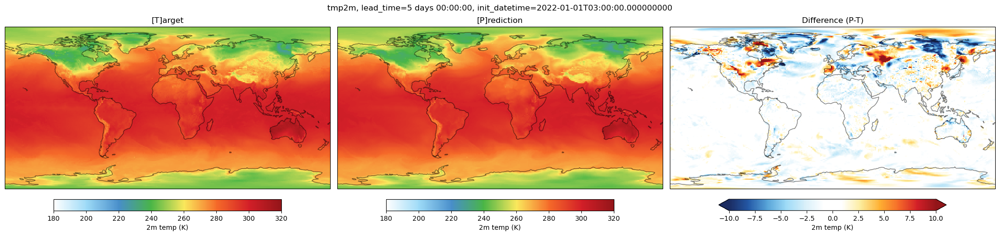

In [31]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"2m temp (K)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":180, "vmax":320,}

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-10
kwargs["vmax"]=10
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

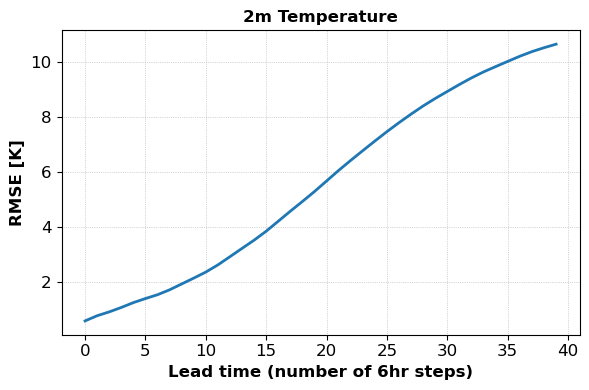

In [18]:
# RMSE Error
tmp2m_sqerror = (ds_tar.tmp2m - ds_pred.tmp2m)**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(tmp2m_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="K", timestep="6hr", varname="2m Temperature"  )
plt.show()

## 2m Specific Humidity

In [19]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "spfh2m"

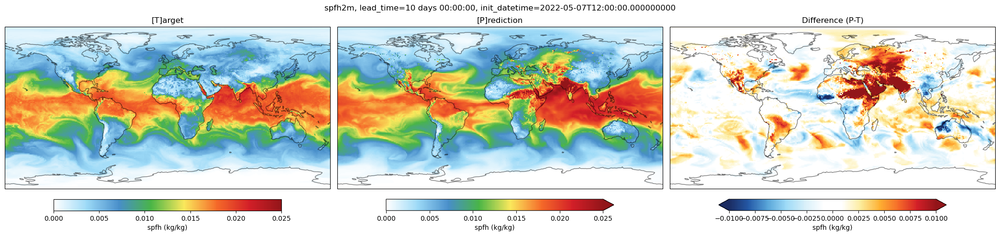

In [20]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"spfh (kg/kg)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":0, "vmax":0.025,}

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.01
kwargs["vmax"]=0.01
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

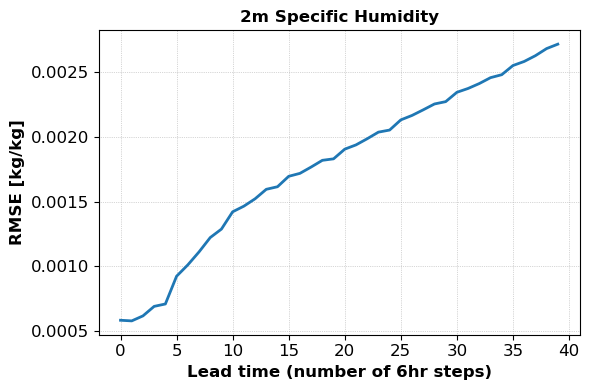

In [21]:
# RMSE Error
spfh2m_sqerror = (ds_tar.spfh2m - ds_pred.spfh2m)**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(spfh2m_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="kg/kg", timestep="6hr", varname="2m Specific Humidity"  )
plt.show()

## 3D variables

### Temperature

In [22]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
ilevel = 4
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "tmp"

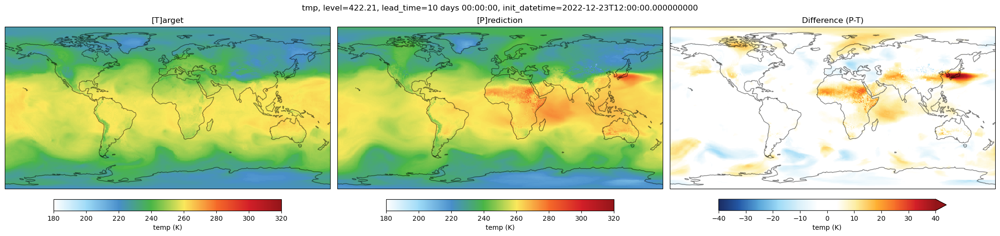

In [23]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"temp (K)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":180, "vmax":320,}

# target
target = ds_tar[variable].isel(level=ilevel, time=itime, lead_time=ileadtime,)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(level=ilevel, time=itime, lead_time=ileadtime,)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-40
kwargs["vmax"]=40
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, level={ds_pred.coords['level'][ilevel].values:.2f}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

### Specific Humidity

In [24]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
ilevel = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "spfh"

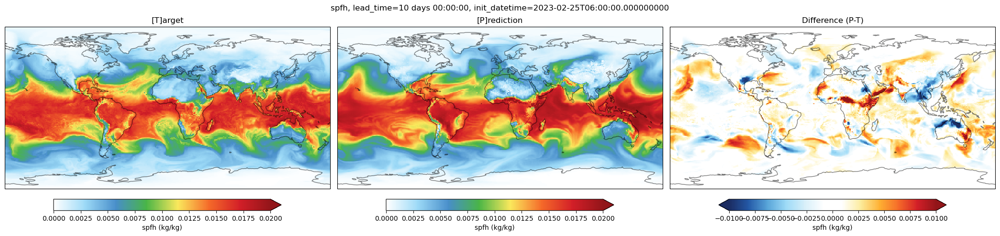

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(21,5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"spfh (kg/kg)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed, "vmin":0, "vmax":0.02,}

# target
target = ds_tar[variable].isel(level=ilevel, time=itime, lead_time=ileadtime,)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(level=ilevel, time=itime, lead_time=ileadtime,)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.01
kwargs["vmax"]=0.01
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

## Wind

In [51]:
itime = 0 # select an initialization time
ileadtime = 19
level = 250
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "wind_speed"

In [52]:
wind_speed_target = np.sqrt(np.square(ds_tar.ugrd.sel(level=level, method="nearest").isel(time=itime, lead_time=ileadtime,)) 
                        + np.square(ds_tar.vgrd.sel(level=level, method="nearest").isel(time=itime, lead_time=ileadtime,)))
wind_speed_prediction = np.sqrt(np.square(ds_pred.ugrd.sel(level=level, method="nearest").isel(time=itime, lead_time=ileadtime,)) 
                        + np.square(ds_pred.vgrd.sel(level=level, method="nearest").isel(time=itime, lead_time=ileadtime,)))
diff = wind_speed_prediction - wind_speed_target

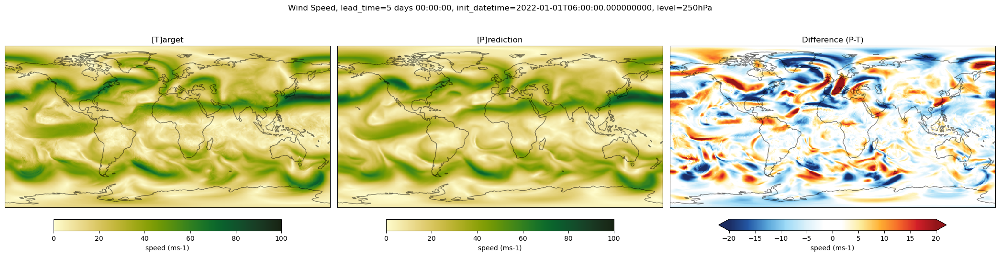

In [53]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
vmin = 0
vmax = 100
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"speed (ms-1)", "pad":0.05}, 
          "robust":True, "cmap":cm.speed, "vmin":vmin, "vmax":vmax,}

# target
wind_speed_target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
wind_speed_prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-20
kwargs["vmax"]=20
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(wind_speed_prediction.lead_time.values, unit="D")
plt.suptitle(f"Wind Speed, lead_time={leadtime}, init_datetime={wind_speed_prediction.time.values}, level={level}hPa")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_level-{level}hPa_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

# Oceans

### SSH

In [8]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "SSH"

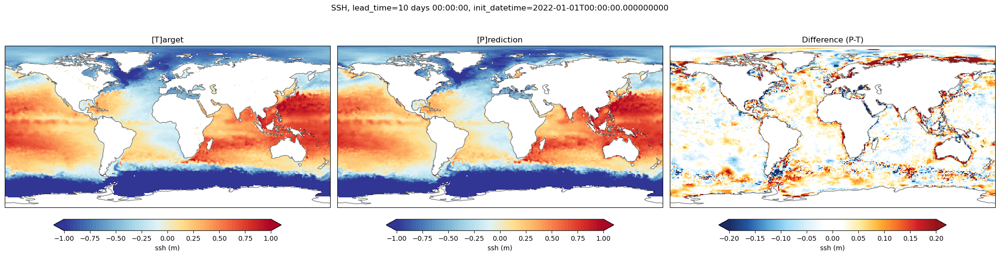

In [9]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"ssh (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.cmp_b2r, "vmin":-1, "vmax":1,}

ocean_mask = 1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
ocean_mask = 1-ocn.landsea_mask.isel(z_l=0,)
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.2
kwargs["vmax"]=0.2
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

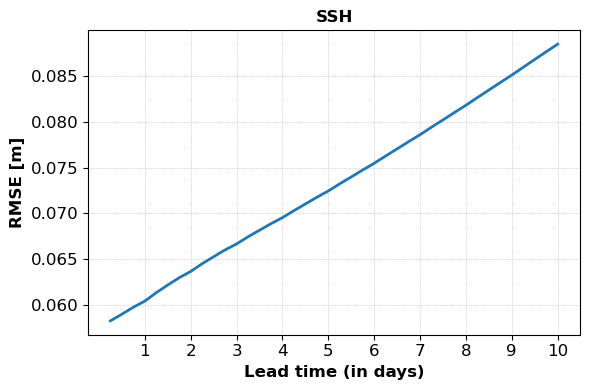

In [10]:
ssh_sqerror = (ds_tar.SSH - ds_pred.SSH*(1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})))**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(ssh_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="m", timestep="6hr", varname="SSH"  )
plt.show()

### Temp

In [11]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
iz_l = 0
variable = "temp"

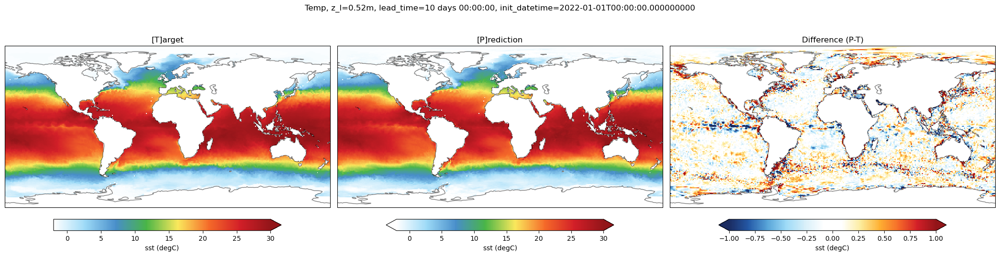

In [12]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"sst (degC)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlueGreenYellowRed	, "vmin":-2, "vmax":30,}

ocean_mask = xr.where(ds_tar.so.isel(time=0, lead_time=0, z_l=iz_l)==0, 0, 1)

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-1
kwargs["vmax"]=1
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(ds_pred.coords["lead_time"][ileadtime].values, unit="D")
initdate = ds_pred.coords["time"][itime].values
plt.suptitle(f"Temp, z_l={target.z_l.values:.2f}m, lead_time={leadtime}, init_datetime={initdate}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"SST_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

In [13]:
# latitude vs depth RMSE for 3D temp
# get the landsea_mask
landsea_mask = xr.where(ds_tar.so.isel(time=0, lead_time=0)==0, 0, 1)

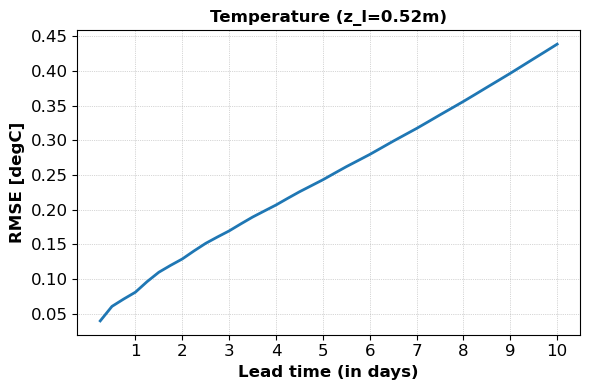

In [14]:
temp_sqerror = (ds_tar.temp.isel(z_l=iz_l) - ds_pred.temp.isel(z_l=iz_l)*landsea_mask.isel(z_l=iz_l))**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(temp_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="degC", timestep="6hr", varname=f"Temperature (z_l={temp_sqerror.z_l.values:.2f}m)")
plt.show()

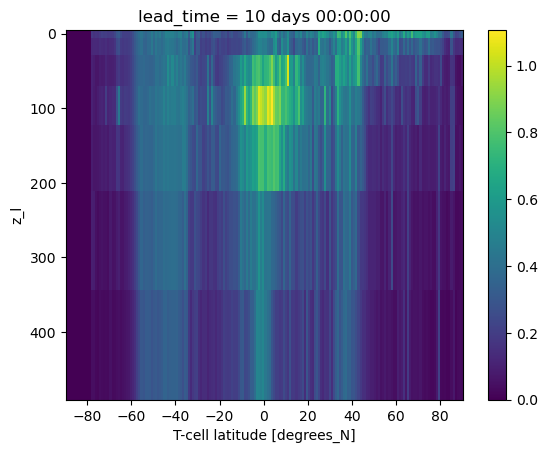

In [15]:
ileadtime = -1
temp_sqerror_depth = (ds_tar.temp - (ds_pred.temp*landsea_mask))**2
temp_rmse_latdepth = np.sqrt(temp_sqerror_depth.mean(dim=("time", "lon")),)
temp_rmse_latdepth.isel(lead_time=ileadtime).plot()
plt.gca().invert_yaxis()
plt.show()

## Salinity

In [16]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
iz_l = 0
vmin=32; vmax=37
variable = "so"

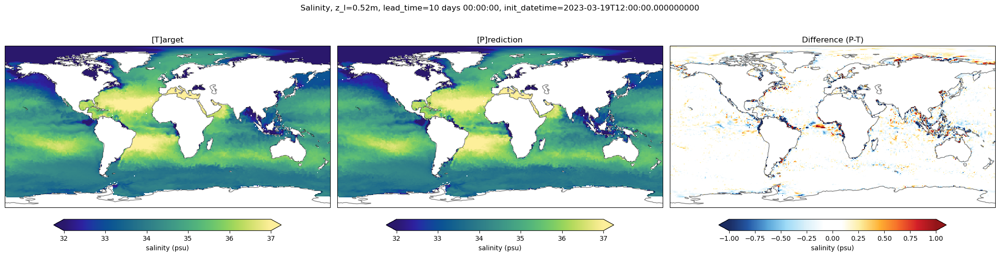

In [17]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"salinity (psu)", "pad":0.05}, 
          "robust":True, "cmap":cm.haline, "vmin":vmin, "vmax":vmax,}

ocean_mask = xr.where(ds_tar.so.isel(time=0, lead_time=0, z_l=iz_l)==0, 0, 1)

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime, z_l=iz_l).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-1
kwargs["vmax"]=1
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(ds_pred.coords["lead_time"][ileadtime].values, unit="D")
initdate = ds_pred.coords["time"][itime].values
plt.suptitle(f"Salinity, z_l={target.z_l.values:.2f}m, lead_time={leadtime}, init_datetime={initdate}")

plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"SST_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

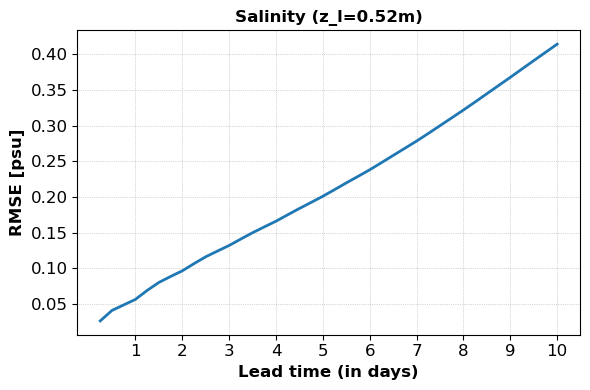

In [18]:
landsea_mask = xr.where(ds_tar.so.isel(time=0, lead_time=0)==0, 0, 1)
sal_sqerror = (ds_tar.so.isel(z_l=iz_l) - ds_pred.so.isel(z_l=iz_l)*landsea_mask.isel(z_l=iz_l))**2

fig, ax = plt.subplots(1, 1, figsize=(6,4))
_ = plot_rmse(ax, np.sqrt(sal_sqerror.mean(dim=('time','lat', 'lon'))), 
              unit="psu", timestep="6hr", varname=f"Salinity (z_l={temp_sqerror.z_l.values:.2f}m)")
plt.show()

## LW fluxes

In [28]:
itime = 0 #np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = 19
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "LW"
vmin = -100; vmax=0

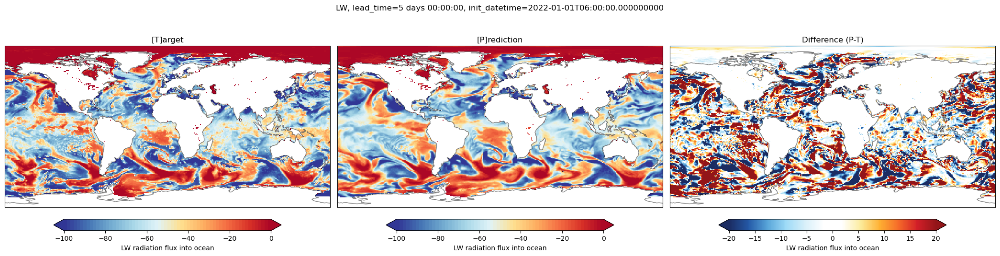

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"LW radiation flux into ocean", 
                         "pad":0.05}, "robust":True, "cmap":cm.cmp_b2r, "vmin":vmin, "vmax":vmax,}

ocean_mask = 1 - atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-20
kwargs["vmax"]=20
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

## Geostrophic current
#### Geostrophic currents are derived from forecasted SSH under the geostrophic approximation:
#### $ v(\phi, \theta, t) = gf^{-1}\nabla_{\perp} \eta(\phi, \lambda, t)$
#### In (lat,lon) coordinates:
#### $u = \frac{-g}{fR_E} \frac{d\eta}{d\phi}, v = \frac{g}{fR_E cos(\phi)} \frac{d\eta}{d\lambda}; \phi=latitude, \lambda=longitude$
#### In this formulation, u and v would have units of m/s. Note that you would also need to divide the derivatives by $\pi/180$ to convert dlat, dlon in degrees to radians 

In [23]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
variable = "geostrophic_current_speed"

In [24]:
def geostrophic_current_from_ssh(ssh):
    g = 9.81        # acceleration due to gravity (m/s2)
    omega = 7.29e-5 # earth's angular velocity (radians/sec)
    R = 6.371e6     # radius of the earth (meters)

    lat2d, lon2d = np.meshgrid(ssh.coords["lat"], ssh.coords["lon"], indexing="ij")
    da_lat2d = xr.DataArray(lat2d, dims=("lat", "lon"),
                            coords = {"lat":ssh.coords["lat"].values, 
                                      "lon":ssh.coords["lon"].values})

    f = 2*omega*np.sin((np.pi/180)*da_lat2d)
    f = f.where(np.abs(f)>1e-5, np.nan)

    # u geostrophic
    ugeo = (-g/f)*ssh.differentiate("lat")/(np.pi/180)/R  # (-g/fR)*deta/dy

    # v geostrophic
    vgeo = (g/f)*ssh.differentiate("lon")/(np.pi/180)/(R*np.cos((np.pi/180)*da_lat2d))  # (g/fRcos\theta)*dh/dx

    # geostrophic current speed 
    speedgeo = np.sqrt(ugeo**2 + vgeo**2)
    
    return ugeo, vgeo, speedgeo

In [25]:
# geostrophic current speed 
_, _, geospeed_pred = geostrophic_current_from_ssh(ds_pred.SSH)
_, _, geospeed_tar = geostrophic_current_from_ssh(ds_tar.SSH)

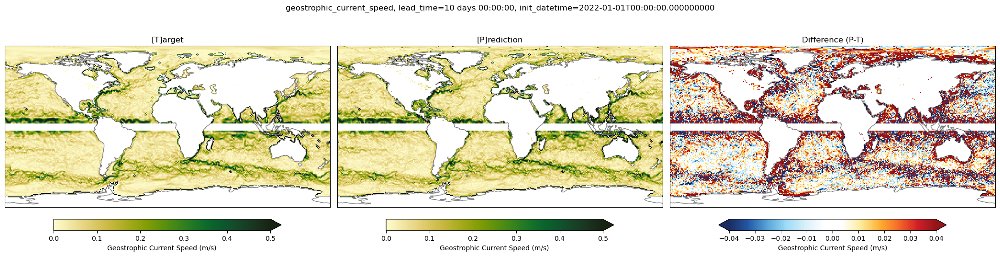

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"Geostrophic Current Speed (m/s)", "pad":0.05}, 
          "robust":True, "cmap":cm.speed, "vmin":0, "vmax":0.5,}

ocean_mask = 1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = geospeed_tar.isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = geospeed_pred.isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.04
kwargs["vmax"]=0.04
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

## Vorticity
### Vorticity = $\nabla \times \vec{v}$ = $\partial v/\partial x - \partial u/\partial y$

In [27]:
def vorticity(u, v,):
    R = 6.371e6  # Earth's radius in meters

    lat2d, lon2d = np.meshgrid(u.coords["lat"], u.coords["lon"], indexing="ij")
    da_lat2d = xr.DataArray(lat2d, dims=("lat", "lon"),
                            coords = {"lat":u.coords["lat"].values, 
                                      "lon":u.coords["lon"].values})
    da_lon2d = xr.DataArray(lon2d, dims=("lat", "lon"),
                            coords = {"lat":u.coords["lat"].values, 
                                      "lon":u.coords["lon"].values})

    # gradients
    dv_dx = v.differentiate("lon")/(np.pi/180)/(R*np.cos((np.pi/180)*da_lat2d))
    du_dy = u.differentiate("lat")/(np.pi/180)/R

    # Return vorticity
    return dv_dx - du_dy

In [28]:
iz_l = 0

In [29]:
# vorticity
vort_pred = vorticity(ds_pred.uo.isel(z_l=iz_l), ds_pred.vo.isel(z_l=iz_l))
vort_tar = vorticity(ds_tar.uo.isel(z_l=iz_l), ds_tar.vo.isel(z_l=iz_l))

In [30]:
# verify using metpy
import metpy.calc as mpcalc
u = ds_pred.uo.isel(z_l=iz_l).assign_attrs({"units":"m/s"})
v = ds_pred.vo.isel(z_l=iz_l).assign_attrs({"units":"m/s"})

vort_pred_metpy = mpcalc.vorticity(u, v,)
#vort_tar = mpcalc.vorticity(ds_tar.uo.isel(z_l=iz_l), ds_tar.vo.isel(z_l=iz_l))

In [31]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
variable = "vorticity"

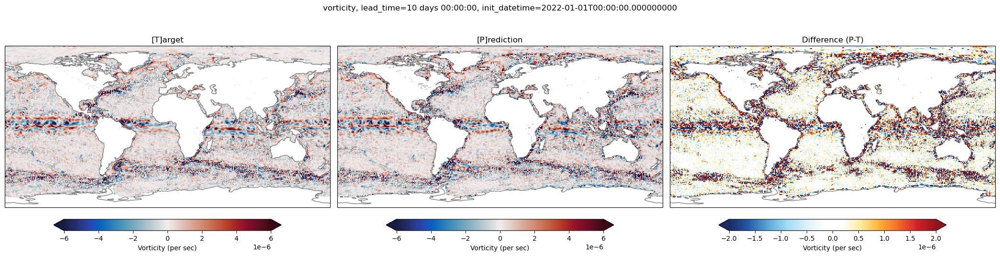

In [32]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"Vorticity (per sec)", "pad":0.05}, 
          "robust":True, "cmap":cm.balance, "vmin":-6e-6, "vmax":6e-6,}

ocean_mask = 1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = vort_tar.isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].set_title("[T]arget")

# prediction
prediction = vort_pred.isel(time=itime, lead_time=ileadtime,).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-2e-6
kwargs["vmax"]=2e-6
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

### Ice Concentration 

In [13]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "icec"

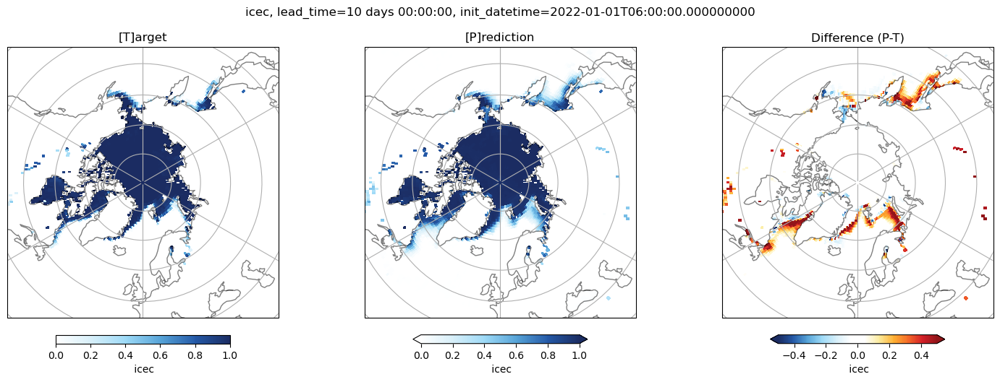

In [14]:
# North Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":f" {variable}", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":1,}

ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_north_pole.png"), dpi=300)
plt.show()

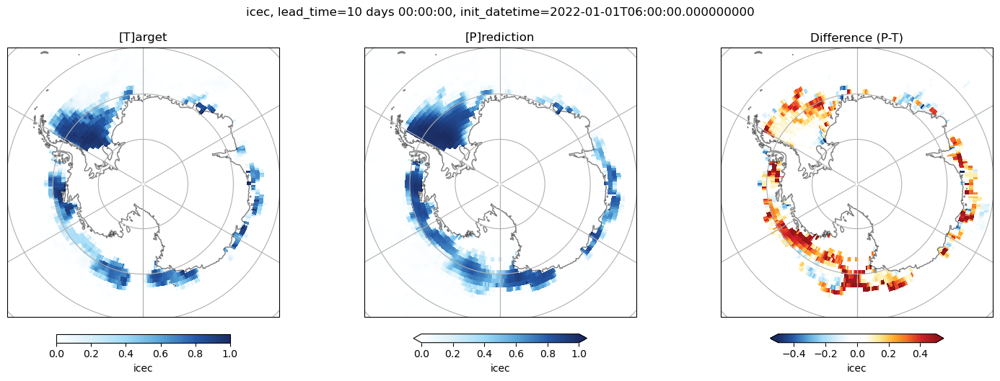

In [17]:
# South Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.SouthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":f"{variable}", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":1,}


# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, -60, -90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_south_pole.png"), dpi=300)
plt.show()

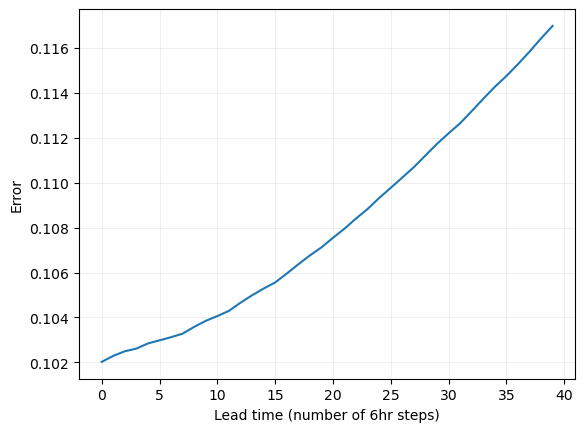

In [16]:
icec_sqerror = (ds_tar.icec - ds_pred.icec*(1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})))**2
plt.plot(np.sqrt(icec_sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('Error')
plt.xlabel('Lead time (number of 6hr steps)')
plt.grid(alpha=0.2)
plt.show()

### Ice Thickness

In [25]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = 7
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "icetk"

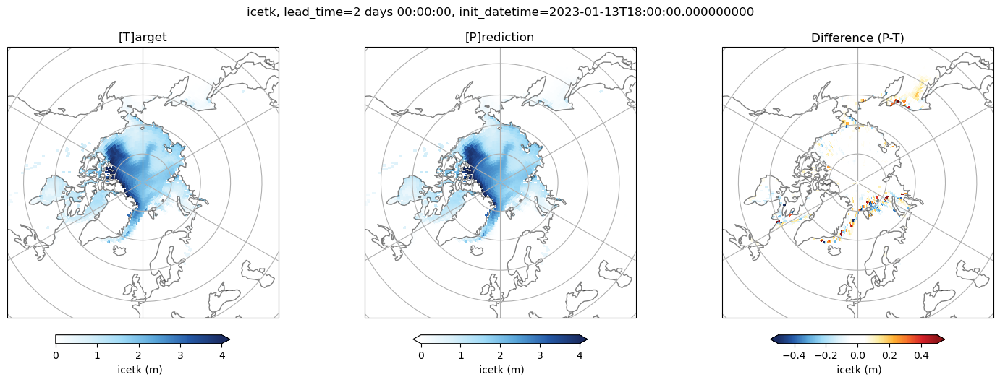

In [26]:
# North Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":" icetk (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":4,}

ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, 45, 90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_north_pole.png"), dpi=300)
plt.show()

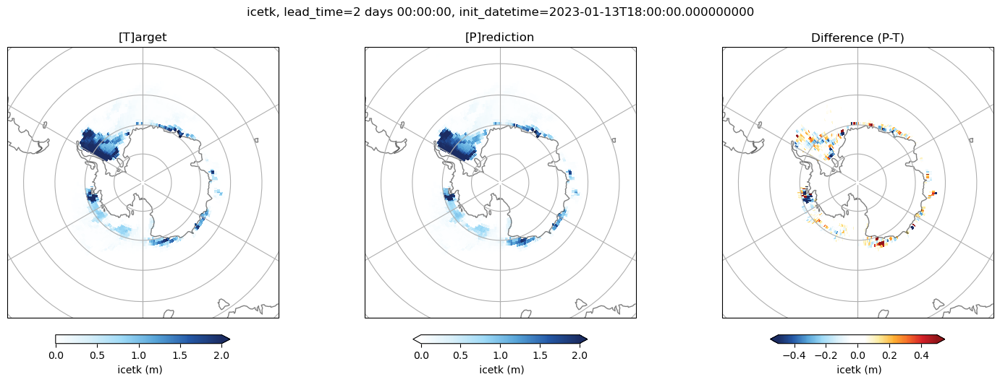

In [27]:
# South Pole
fig, axs = plt.subplots(1, 3, figsize=(15,5.5), subplot_kw=dict(projection=ccrs.SouthPolarStereo()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.5, "label":" icetk (m)", "pad":0.05}, 
          "robust":True, "cmap":cm.WhiteBlue, "vmin":0, "vmax":2,}

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].set_extent([0, 360, -45, -90], crs=ccrs.PlateCarree())
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
ocean_mask = 1-atm.land_static.rename({"grid_yt":"lat", "grid_xt":"lon"})
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime).where(ocean_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].set_extent([0, 360, -45, -90], crs=ccrs.PlateCarree())
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-0.5
kwargs["vmax"]=0.5
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].set_extent([0, 360, -45, -90], crs=ccrs.PlateCarree())
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}_south_pole.png"), dpi=300)
plt.show()

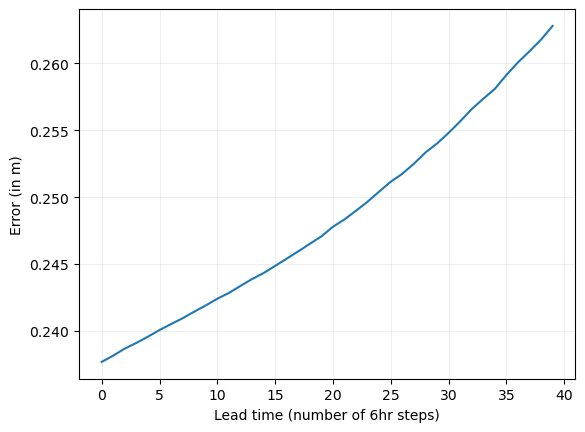

In [28]:
icetk_sqerror = (ds_tar.icetk - ds_pred.icetk*(1-atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})))**2
plt.plot(np.sqrt(icetk_sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('Error (in m)')
plt.xlabel('Lead time (number of 6hr steps)')
plt.grid(alpha=0.2)
plt.show()

## Average Snow Cover

In [40]:
itime = np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = 7
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "snowc_ave"

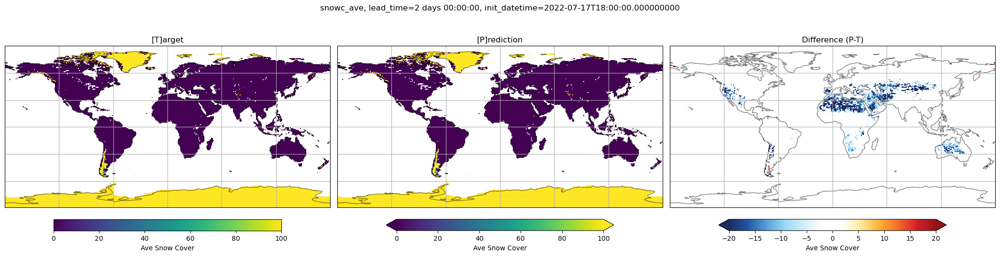

In [45]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.PlateCarree()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"Ave Snow Cover", "pad":0.05}, 
          "robust":True, "cmap":"viridis", "vmin":0, "vmax":100,}

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
land_mask = atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-20
kwargs["vmax"]=20
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
#plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

### Land : Soil Moisture

In [27]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "soilm"

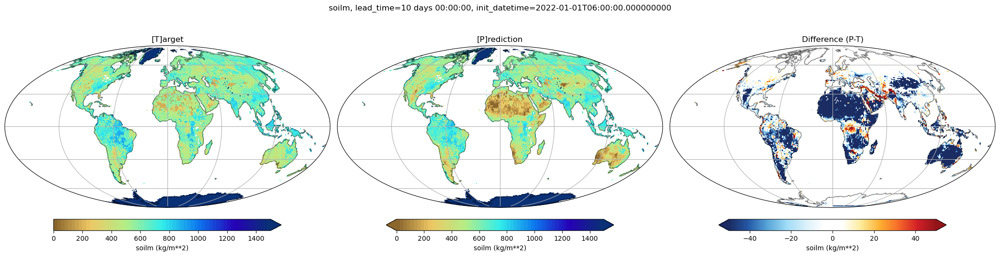

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.Mollweide()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"soilm (kg/m**2)", "pad":0.05}, 
          "robust":True, "cmap":cm.GMT_drywet, "vmin":0, "vmax":1500,}

land_mask = atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-50
kwargs["vmax"]=50
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

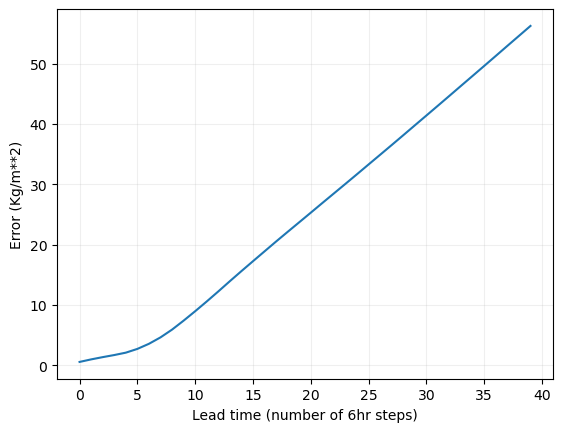

In [31]:
soilm_sqerror = (ds_tar.soilm - ds_pred.soilm*(atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})))**2
plt.plot(np.sqrt(soilm_sqerror.mean(dim=('time','lat', 'lon'))))
plt.ylabel('Error (Kg/m**2)')
plt.xlabel('Lead time (number of 6hr steps)')
plt.grid(alpha=0.2)
plt.show()

## Vegetation Fraction

In [25]:
itime = 0#np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time
ileadtime = -1
leadtime = int(ds_pred.lead_time[ileadtime].values/3600/1e9)
variable = "veg"

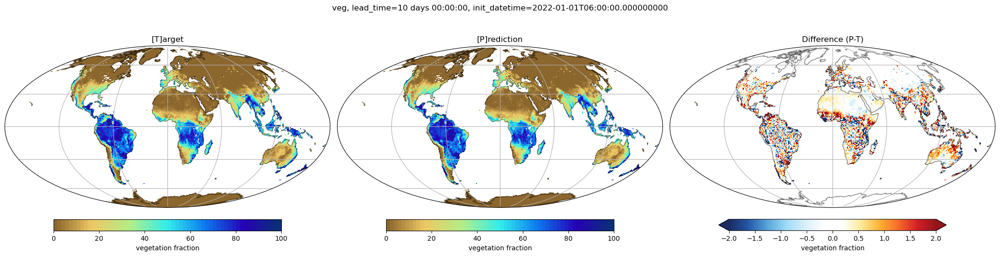

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(21,5.5), subplot_kw=dict(projection=ccrs.Mollweide()))
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":f"vegetation fraction", "pad":0.05}, 
          "robust":True, "cmap":cm.GMT_drywet, "vmin":0, "vmax":100,}

land_mask = atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})

# target
target = ds_tar[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
target.plot(ax=axs[0], transform=ccrs.PlateCarree(), **kwargs)
axs[0].coastlines(alpha=0.5)
axs[0].gridlines()
axs[0].set_title("[T]arget")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ileadtime,).where(land_mask)
prediction.plot(ax=axs[1], transform=ccrs.PlateCarree(), **kwargs)
axs[1].coastlines(alpha=0.5)
axs[1].gridlines()
axs[1].set_title("[P]rediction")

# difference
diff = prediction - target
kwargs["cmap"]=cm.BlueWhiteOrangeRed
kwargs["vmin"]=-2
kwargs["vmax"]=2
diff.plot(ax=axs[2], transform=ccrs.PlateCarree(), **kwargs)
axs[2].coastlines(alpha=0.5)
axs[2].gridlines()
axs[2].set_title("Difference (P-T)")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"{variable}_{_prototype}_{_expt}.png"), dpi=300)
plt.show()

### A panel of 3 rows -- providing 1 ocean, 1 atmosphere, and 1 cloud feedback variable 

In [46]:
itime = 0 #np.random.randint(0, ds_pred.sizes["time"]) # randomly select an initialization time

In [42]:
clima_sst = ocn.temp.isel(z_l=0).mean(dim="time").compute()

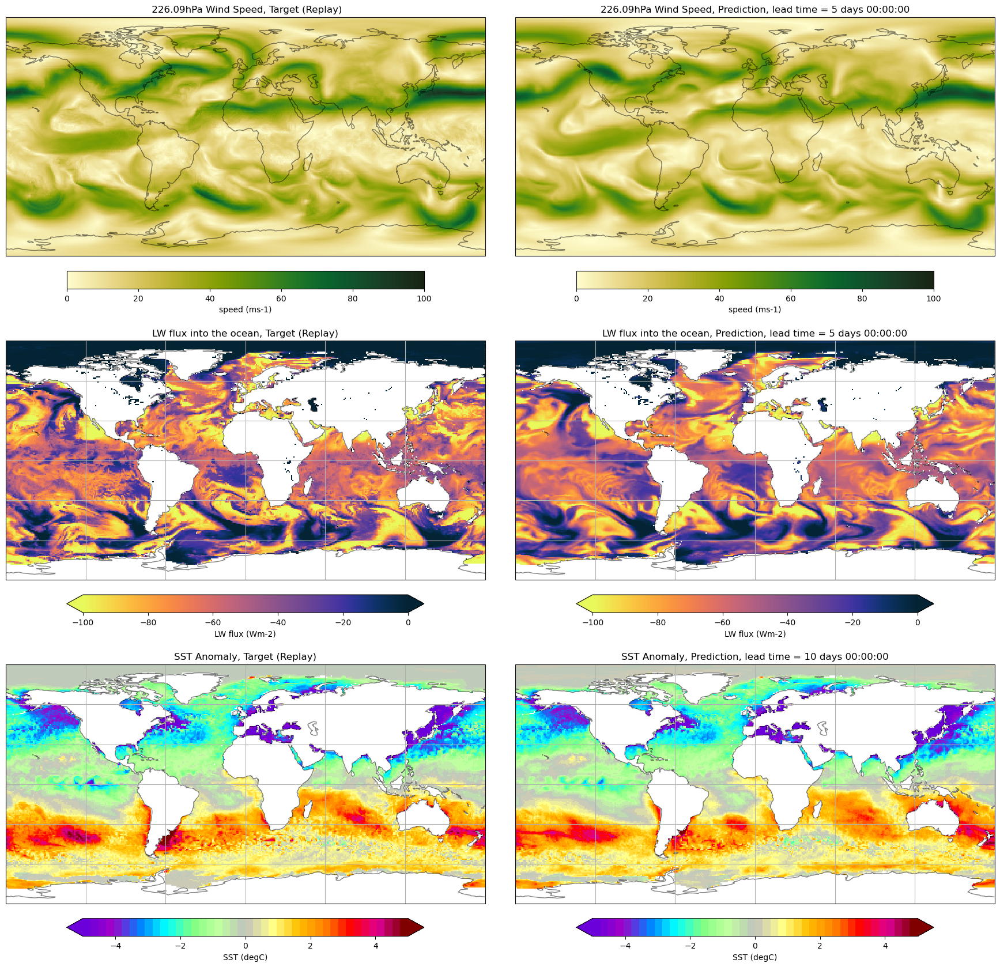

In [53]:
fig, axs = plt.subplots(3, 2, figsize=(18,17), subplot_kw=dict(projection=ccrs.PlateCarree()))

############# Row 1 - Jet Stream Wind ###############
ilead = 5*4 - 1
level = 250
leadtime = int(ds_pred.lead_time[ilead].values/3600/1e9)
target = np.sqrt(np.square(ds_tar.ugrd.sel(level=level, method="nearest").isel(lead_time=ilead,)) 
                 + np.square(ds_tar.vgrd.sel(level=level, method="nearest").isel(lead_time=ilead,)))
prediction = np.sqrt(np.square(ds_pred.ugrd.sel(level=level, method="nearest").isel(lead_time=ilead,)) 
                     + np.square(ds_pred.vgrd.sel(level=level, method="nearest").isel(lead_time=ilead,)))
sqerror = (prediction - target)**2
rmse = np.sqrt(sqerror.mean(dim=('time')))

vmin = 0
vmax = 100
display_name = f"{prediction.level.values:.2f}hPa Wind Speed"
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"speed (ms-1)", "pad":0.05}, 
          "robust":True, "cmap":cm.speed, "vmin":vmin, "vmax":vmax,}

# target
target.isel(time=0).plot(ax=axs[0][0], transform=ccrs.PlateCarree(), **kwargs)
axs[0][0].coastlines(alpha=0.5)
axs[0][0].set_title(f" {display_name}, Target (Replay)")

# prediction
prediction.isel(time=0).plot(ax=axs[0][1], transform=ccrs.PlateCarree(), **kwargs)
axs[0][1].coastlines(alpha=0.5)
leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
axs[0][1].set_title(f"{display_name}, Prediction, lead time = {leadtime}")

# RMSE
#kwargs["cmap"]=cm.BlueWhiteOrangeRed
#kwargs["vmin"]=-20
#kwargs["vmax"]=20
#rmse.plot(ax=axs[0][2], transform=ccrs.PlateCarree(), **kwargs)
#axs[0][2].coastlines(alpha=0.5)
#axs[0][2].set_title("RMSE")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")

############# Row 2 - Long Wave Fluxes into the ocean ###############
ilead = 5*4-1
variable = "LW"
display_name = "LW flux into the ocean"
vmin=-100
vmax=0
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"LW flux (Wm-2)", "pad":0.05}, 
          "robust":True, "cmap":cm.thermal_r, "vmin":vmin, "vmax":vmax,}

# target
sea_mask = 1 - atm.land_static.rename({"grid_xt":"lon", "grid_yt":"lat"})
target = ds_tar[variable].isel(time=itime, lead_time=ilead,).where(sea_mask)
target.plot(ax=axs[1][0], transform=ccrs.PlateCarree(), **kwargs)
axs[1][0].coastlines(alpha=0.5)
axs[1][0].gridlines()
axs[1][0].set_title(f"{display_name}, Target (Replay)")

# prediction
prediction = ds_pred[variable].isel(time=itime, lead_time=ilead,).where(sea_mask)
prediction.plot(ax=axs[1][1], transform=ccrs.PlateCarree(), **kwargs)
axs[1][1].coastlines(alpha=0.5)
axs[1][1].gridlines()
leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
axs[1][1].set_title(f"{display_name}, Prediction, lead time = {leadtime}")

# RMSE
#sqerror = (ds_pred[variable].isel(lead_time=ilead,).where(~land_mask) - ds_tar[variable].isel(lead_time=ilead,).where(~land_mask))**2
#rmse = np.sqrt(sqerror.mean(dim=('time')))
#kwargs["cmap"]=cm.thermal
#kwargs["vmin"]=0
#kwargs["vmax"]=50
#rmse.plot(ax=axs[1][2], transform=ccrs.PlateCarree(), **kwargs)
#axs[1][2].coastlines(alpha=0.5)
#axs[1][2].gridlines()
#axs[1][2].set_title("RMSE")

leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")

############# Row 3 - SST Anomalies ###############
ilead = 10*4-1
variable = "temp"
display_name = "SST Anomaly"
iz_l = 0
vmin=-5
vmax=5
kwargs = {"cbar_kwargs":{"orientation": "horizontal", "shrink":0.7, "label":"SST (degC)", "pad":0.05}, 
          "robust":True, "cmap":cm.GHRSST_anomaly, "vmin":vmin, "vmax":vmax,}

# target
sea_mask = 1 - ocn.landsea_mask.isel(z_l=iz_l)
clima_tar = ds_tar[variable].isel(z_l=iz_l).mean(dim=("time", "lead_time"))
target = ds_tar[variable].isel(time=itime, lead_time=ilead, z_l=iz_l).where(sea_mask) - clima_tar.where(sea_mask) #tar.where(sea_mask)
target.plot(ax=axs[2][0], transform=ccrs.PlateCarree(), **kwargs)
axs[2][0].coastlines(alpha=0.5)
axs[2][0].gridlines()
axs[2][0].set_title(f"{display_name}, Target (Replay)")

# prediction
clima_pred = ds_pred[variable].isel(z_l=iz_l).mean(dim=("time","lead_time"))
prediction = ds_pred[variable].isel(time=itime, lead_time=ilead, z_l=iz_l).where(sea_mask) - clima_pred.where(sea_mask) #pred.where(sea_mask)
prediction.plot(ax=axs[2][1], transform=ccrs.PlateCarree(), **kwargs)
axs[2][1].coastlines(alpha=0.5)
axs[2][1].gridlines()
leadtime = pd.to_timedelta(prediction.lead_time.values, unit="D")
axs[2][1].set_title(f"{display_name}, Prediction, lead time = {leadtime}")

# RMSE
#sqerror = (ds_pred[variable].isel(lead_time=ilead,).where(~land_mask) - ds_tar[variable].isel(lead_time=ilead,).where(~land_mask))**2
#rmse = np.sqrt(sqerror.mean(dim=('time')))
#kwargs["cmap"]=cm.thermal
#kwargs["vmin"]=0
#kwargs["vmax"]=5
#diff.plot(ax=axs[2][2], transform=ccrs.PlateCarree(), **kwargs)
#axs[2][2].coastlines(alpha=0.5)
#axs[2][2].gridlines()
#axs[2][2].set_title("Difference (P-T)")
#plt.suptitle(f"{variable}, lead_time={leadtime}, init_datetime={prediction.time.values}")
plt.tight_layout()
plt.savefig(os.path.join(_figdir, f"WindSpeed_LW_SSTAnomaly_Predictions_Targets_{_prototype}_{_expt}.png"), dpi=300)
plt.show()